### CMG Data Analysis

Running analysis for iEC


/var/folders/p7/kpn2wtl53w9bjt1kf0s_jfh40000gq/T/ipykernel_99569/861404823.py:27: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=2.0)


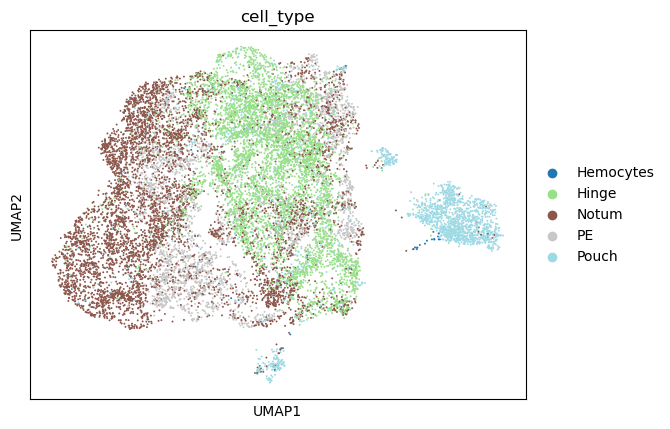

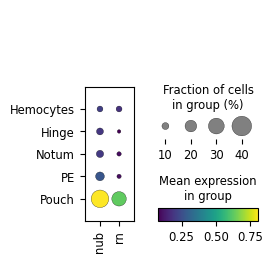

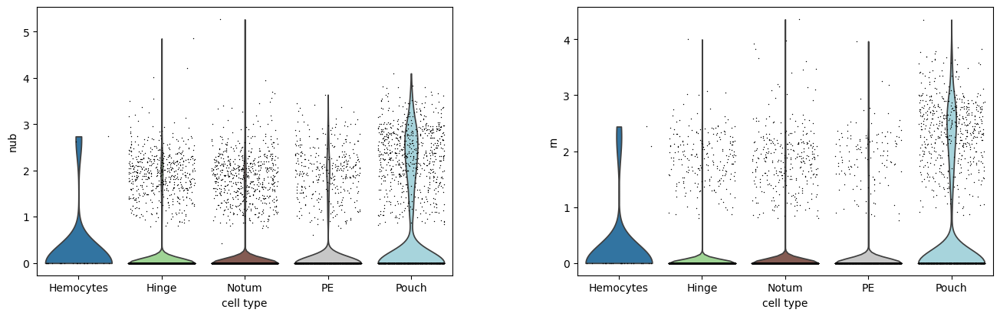

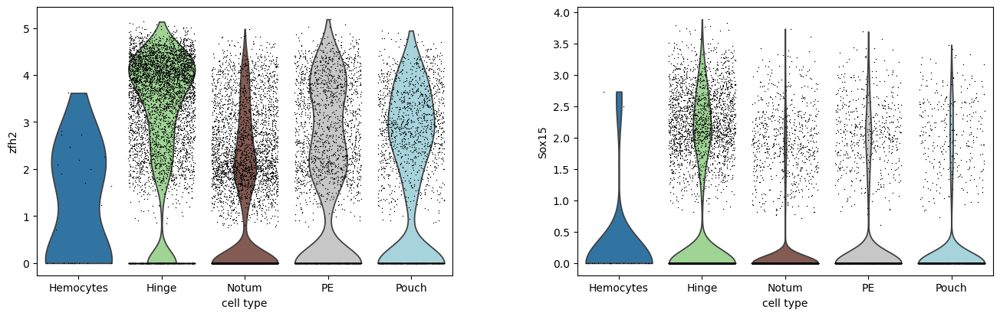

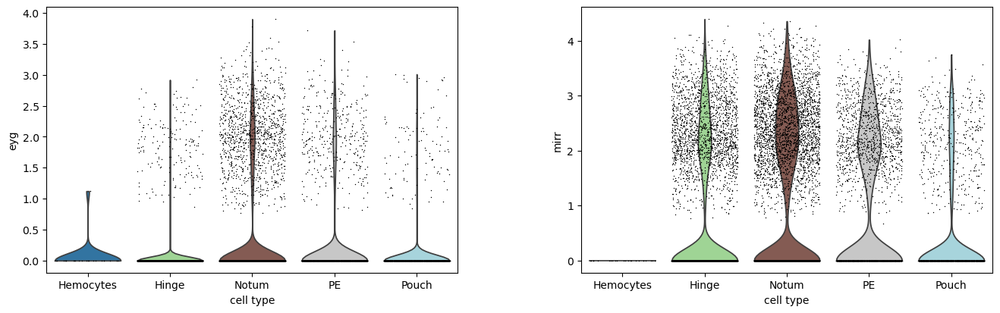

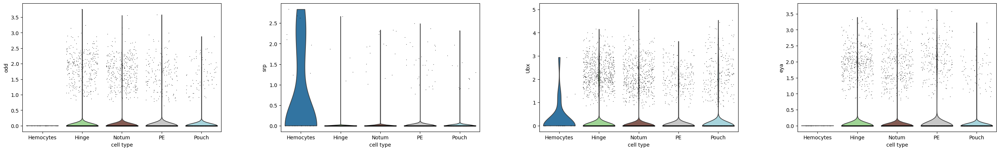

Running analysis for ctrl


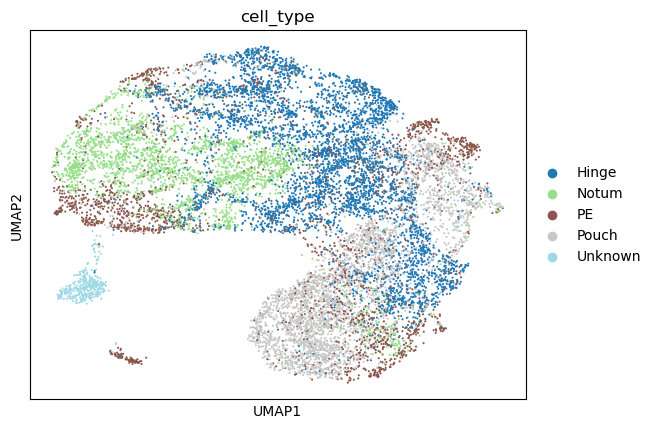

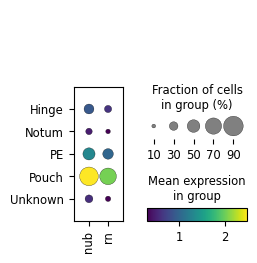

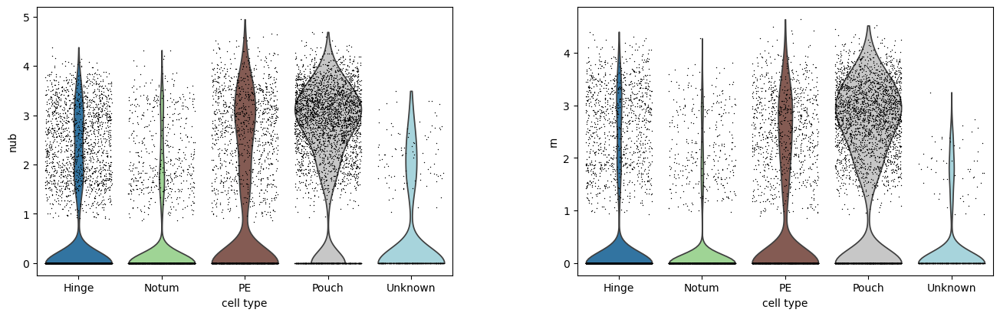

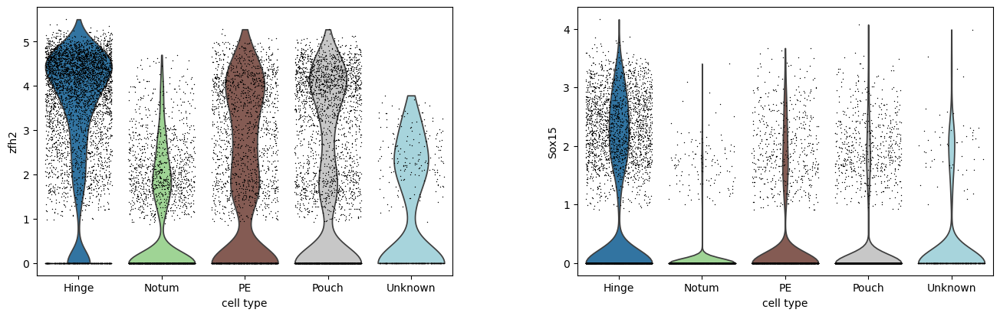

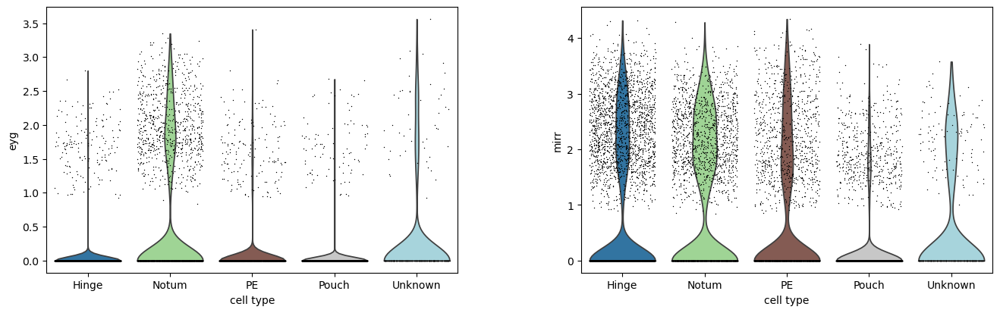

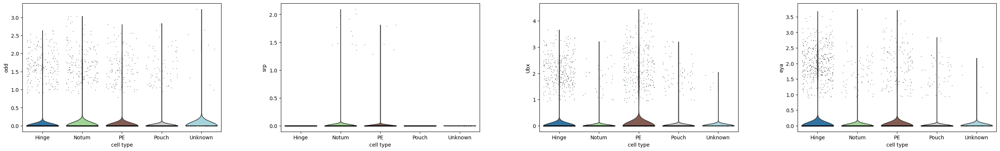

In [2]:
import os
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load scRNA-seq data
def load_scRNA_seq_data(sample_name, data_directory):
    matrix_file = os.path.join(data_directory, sample_name, 'matrix.mtx.gz')
    genes_file = os.path.join(data_directory, sample_name, 'genes.tsv.gz')
    barcodes_file = os.path.join(data_directory, sample_name, 'barcodes.tsv.gz')

    adata = sc.read_mtx(matrix_file).T
    adata.var_names = pd.read_csv(genes_file, header=None, sep='\t')[0]
    adata.obs_names = pd.read_csv(barcodes_file, header=None)[0]
    return adata

# Preprocess data for visualization
def preprocess_data_for_visualization(adata):
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=1000)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=2.0)
    return adata

# Assign cell types from annotation files with prefix cleaning
def assign_cell_types_from_annotations(adata, annotation_file, barcode_column, annotation_column, prefix_to_strip):
    annotations = pd.read_csv(annotation_file)
    annotations[barcode_column] = annotations[barcode_column].astype(str)
    cleaned_barcodes = adata.obs_names.str.replace(prefix_to_strip, "")
    adata.obs_names = cleaned_barcodes
    annotations = annotations.set_index(barcode_column)
    adata.obs['cell_type'] = adata.obs_names.map(annotations[annotation_column]).fillna('Unknown')
    return adata

# Plot UMAP with cell type labels
def plot_umap_with_cell_types(adata, sample_id, output_dir, color_map='tab20'):
    os.makedirs(output_dir, exist_ok=True)
    sc.pl.umap(adata, color='cell_type', palette=color_map, save=f'_{sample_id}_umap_cell_types.png')

# Plot Expression Dotplot
def plot_expression_dotplot(adata, sample_id, output_dir, genes, groupby='cell_type', color_map='viridis'):
    os.makedirs(output_dir, exist_ok=True)
    
    # Validate genes by checking if they exist in var_names
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    
    if not valid_genes:
        print(f"No valid genes found in {sample_id} for dotplot.")
        return
    
    sc.pl.dotplot(adata, var_names=valid_genes, groupby=groupby, use_raw=False, color_map=color_map, save=f'_{sample_id}_dotplot.png')

# Plot Heatmap for Gene Markers
def plot_gene_marker_heatmap(adata, sample_id, output_dir, marker_dict, color_map='viridis'):
    os.makedirs(output_dir, exist_ok=True)
    
    genes = [gene for gene_list in marker_dict.values() for gene in gene_list if gene in adata.var_names]
    
    if not genes:
        print(f"No valid genes found in the dataset for the heatmap for {sample_id}.")
        return
    
    try:
        mean_expression = adata.to_df().copy().groupby(adata.obs['cell_type'], observed=True).mean()[genes]
        
        if mean_expression.empty:
            print(f"No data available for heatmap after grouping by cell_type for {sample_id}.")
            return
        
        sns.clustermap(mean_expression, cmap=color_map, figsize=(10, 15))
        plt.savefig(os.path.join(output_dir, f'{sample_id}_marker_heatmap.png'))
        plt.close()
    except Exception as e:
        print(f"Error plotting heatmap for {sample_id}: {e}")

# Plot Violin for Gene Markers
def plot_gene_marker_violin(adata, sample_id, output_dir, marker_dict, groupby='cell_type'):
    os.makedirs(output_dir, exist_ok=True)
    
    for region, genes in marker_dict.items():
        valid_genes = [gene for gene in genes if gene in adata.var_names]
        
        if not valid_genes:
            print(f"No valid genes found for region {region} in {sample_id}.")
            continue
        
        sc.pl.violin(adata, keys=valid_genes, groupby=groupby, jitter=0.4, multi_panel=True)
        plt.savefig(os.path.join(output_dir, f'{sample_id}_violin_{region}.png'))
        plt.close()

# Main analysis pipeline
def analyze_and_visualize(data_directory, samples, annotation_files, barcode_column, annotation_column, epithelial_region_markers, output_dir_default):
    
    for sample_id, sample_name in samples.items():
        print(f'Running analysis for {sample_id}')
        adata = load_scRNA_seq_data(sample_name, data_directory)

        adata = preprocess_data_for_visualization(adata)
        
        # Determine the prefix to strip
        prefix_to_strip = 'iEC_' if sample_id == 'iEC' else 'Ctrl_'
        
        # Assign cell type labels from annotation file
        annotation_file = os.path.join(data_directory, annotation_files[sample_id])
        adata = assign_cell_types_from_annotations(adata, annotation_file, barcode_column, annotation_column, prefix_to_strip)
        
        # Plot UMAP with cell type labels
        plot_umap_with_cell_types(adata, sample_id, output_dir_default)

        # Plot dotplot for gene markers in "Pouch"
        plot_expression_dotplot(adata, sample_id, output_dir_default, epithelial_region_markers["Pouch"])

        # Plot heatmap for gene markers
        plot_gene_marker_heatmap(adata, sample_id, output_dir_default, epithelial_region_markers)
        
        # Plot violin plots for gene markers
        plot_gene_marker_violin(adata, sample_id, output_dir_default, epithelial_region_markers)

# Example usage
data_directory = '../data/Hunter_fruitfly/'
samples = {'iEC': 'iec_output', 'ctrl': 'ctrl_output'}
annotation_files = {
    'iEC': 'iEC_barcodes_tissueAnnotations.csv',
    'ctrl': 'Ctrl_barcodes_tissueAnnotations.csv'
}
barcode_column = 'Unnamed: 0'
annotation_column = 'celltype'

output_dir_default = '../output/CMG'

epithelial_region_markers = {
    "Pouch": ['nub', 'rn'],
    "Hinge": ['zfh2', 'Sox15'],
    "Notum": ['eyg', 'mirr'],
    "PE": ['odd', 'srp', 'hnt', 'Ubx', 'eya']
}

analyze_and_visualize(data_directory, samples, annotation_files, barcode_column, annotation_column, epithelial_region_markers, output_dir_default)


## Spatial Mapping

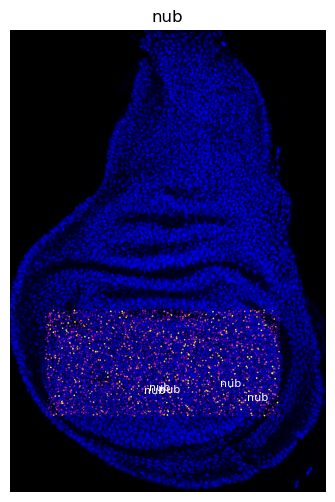

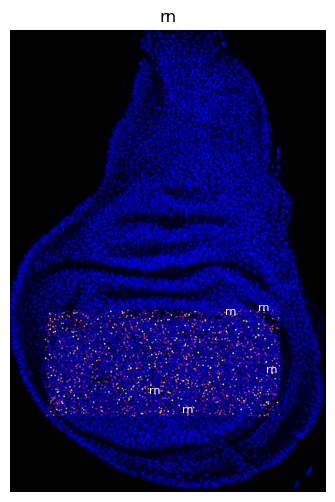

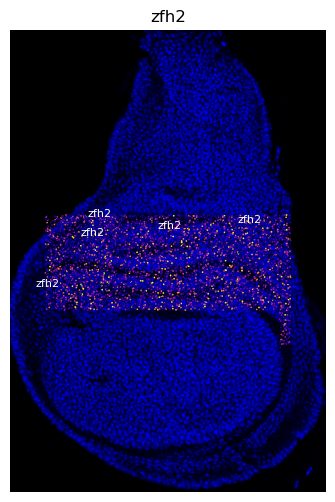

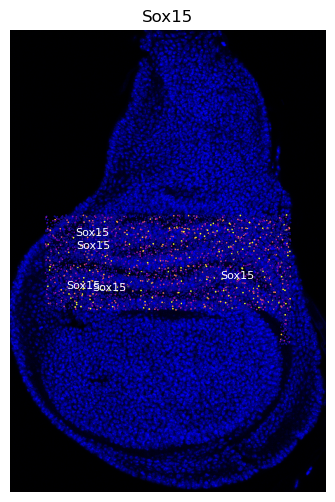

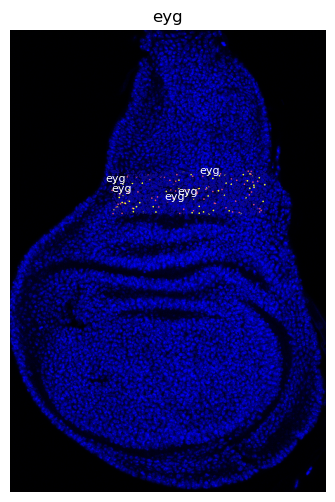

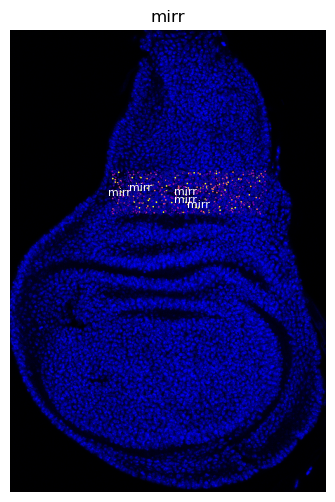

In [3]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from skimage.io import imread
import squidpy as sq
import scipy
import numpy as np

# Load the matrix file (gene expression data)
matrix = scipy.io.mmread("../data/Hunter_fruitfly/ctrl_output/matrix.mtx.gz")
matrix = scipy.sparse.csr_matrix(matrix)

# Load barcodes (cell IDs) and genes (gene names)
barcodes = pd.read_csv("../data/Hunter_fruitfly/ctrl_output/barcodes.tsv.gz", header=None, sep="\t")
genes = pd.read_csv("../data/Hunter_fruitfly/ctrl_output/genes.tsv.gz", header=None, sep="\t")

# Create AnnData object
adata = sc.AnnData(X=matrix.T)
adata.obs['barcodes'] = barcodes[0].values
adata.var_names = genes[0].values

# Load tissue image
tissue_image = imread('../data/Hunter_fruitfly/Image/MAXProjection_Slices9through15_crop.tif')

# Manually define tissue boundaries
x_min, x_max = 50, 400  # X-axis range
y_min, y_max = 200, 550  # Y-axis range

# Generate more scattered random spatial coordinates with some added noise
np.random.seed(42)  # For reproducibility
adata.obsm['spatial'] = np.random.uniform(low=[x_min, y_min], high=[x_max, y_max], size=(adata.shape[0], 2))

# Optionally add a small amount of noise to make the points less uniform
noise_factor = 0.05  # Adjust this to control the amount of noise
adata.obsm['spatial'] += np.random.normal(loc=0, scale=noise_factor, size=adata.obsm['spatial'].shape)

# Mimic the spatial metadata required by squidpy
adata.uns["spatial"] = {
    "fake_library": {
        "images": {"hires": tissue_image},
        "scalefactors": {
            "tissue_hires_scalef": 1.0,
            "spot_diameter_fullres": 8.0  # Increased spot size for better visibility
        }
    }
}

# Define regions and region-specific gene markers
region_coords = {
    "Pouch": {"x_range": (46, 384), "y_range": (399, 599)},
    "Hinge": {"x_range": (0, 450), "y_range": (263, 450), "exclude_x": (46, 384), "exclude_y": (399, 599)},
    "Notum": {"x_range": (145, 365), "y_range": (0, 262)}
}

epithelial_region_markers = {
    "Pouch": ['nub', 'rn'],
    "Hinge": ['zfh2', 'Sox15'],
    "Notum": ['eyg', 'mirr'],
    "PE": ['odd', 'srp', 'hnt', 'Ubx', 'eya']
}

# Function to create region mask
def create_region_mask(spatial_data, x_range, y_range, exclude_x=None, exclude_y=None):
    # Main mask: include points within the x and y ranges
    mask = (spatial_data[:, 0] >= x_range[0]) & (spatial_data[:, 0] <= x_range[1]) & \
           (spatial_data[:, 1] >= y_range[0]) & (spatial_data[:, 1] <= y_range[1])
    
    # Exclude specific regions if exclusion boundaries are provided
    if exclude_x and exclude_y:
        exclusion_mask = (spatial_data[:, 0] >= exclude_x[0]) & (spatial_data[:, 0] <= exclude_x[1]) & \
                         (spatial_data[:, 1] >= exclude_y[0]) & (spatial_data[:, 1] <= exclude_y[1])
        mask = mask & ~exclusion_mask  # Exclude the points in the exclusion region
    
    return mask

# Plot with scattered points
for region, genes in epithelial_region_markers.items():
    if region in region_coords:
        region_mask = create_region_mask(
            adata.obsm['spatial'],
            x_range=region_coords[region]["x_range"],
            y_range=region_coords[region]["y_range"],
            exclude_x=region_coords[region].get("exclude_x"),
            exclude_y=region_coords[region].get("exclude_y")
        )

        valid_mask = (adata.obsm['spatial'][:, 0] >= x_min) & (adata.obsm['spatial'][:, 0] <= x_max) & \
                     (adata.obsm['spatial'][:, 1] >= y_min) & (adata.obsm['spatial'][:, 1] <= y_max)
        region_mask = region_mask & valid_mask

        for gene in genes:
            if gene in adata.var_names:
                fig, ax = plt.subplots(figsize=(6, 6))
                plt.title(f"{gene} expression in {region}")

                # First, plot the tissue image with transparency
                ax.imshow(tissue_image, alpha=0.5)  # Further reduce transparency for more visibility
                
                # Get gene expression data and convert to dense format
                gene_expression = adata[:, gene].X.toarray()

                # Dynamic range for colormap scaling
                vmin, vmax = np.percentile(gene_expression, [2, 98])

                # Plot spatial scatter with dynamic color and size
                sq.pl.spatial_scatter(
                    adata[region_mask, :],
                    color=gene,
                    size=0.3,  # Adjust the spot size for better visibility
                    ax=ax,
                    cmap='plasma',  # Use a bright colormap for better contrast
                    vmin=vmin, vmax=vmax,  # Narrow the range to focus on low to medium expression
                    alpha=1.0,  # Full opacity for the scatter points to make them more visible
                    frameon=False,  # Remove the frame for a cleaner look
                    colorbar=False  # Hide the colorbar for a less cluttered plot
                )

                # Optionally, annotate a few points
                spatial_coords = adata[region_mask, :].obsm['spatial']
                high_expr = np.argsort(gene_expression[region_mask].flatten())[::-1][:5]  # Top 5 points
                high_expr_coords = spatial_coords[high_expr]

                for i, (x, y) in enumerate(high_expr_coords):
                    ax.text(x, y, f"{gene}", fontsize=8, color='white', ha='center')

                plt.show()
            else:
                print(f"Gene {gene} not found in the dataset.")


In [4]:
# Load the genes.tsv.gz file
genes_file_path = '../data/Hunter_fruitfly/ctrl_output/genes.tsv.gz'
genes_df = pd.read_csv(genes_file_path, header=None, sep='\t')

# Extract the list of gene names from the file
genes_present = set(genes_df[0].values)

# Now let's check which genes from the epithelial_region_markers dictionary are present in the genes list
epithelial_region_markers = {
    "Pouch": ["vg", "wg", "dll", "nub", "rn"],
    "Hinge": ["tsh", "dac", "ct", "zfh2", "Sox15"],
    "Notum": ["ap", "mirr", "kni", "eyg", "mirr"],
    "PE": ["odd", "srp", "hnt", "Ubx", "eya"],
    "Anterior Notum": ["ap", "mirr", "hth"],
    "Inner Hinge": ["tsh", "ct", "ser"],
    "Anterior Pouch": ["en", "inv", "hh"],
    "Posterior Pouch": ["ci", "en", "inv"],
    "Anterior Hinge": ["tsh", "hth", "dac"],
    "Posterior Hinge": ["en", "tsh", "dac"],
    "Medial Notum": ["mirr", "ap", "wg"],
    "Lateral Notum": ["tsh", "hth", "dac"]
}

# Check which genes are present in the dataset
updated_epithelial_region_markers = {
    region: [gene for gene in genes if gene in genes_present]
    for region, genes in epithelial_region_markers.items()
}

updated_epithelial_region_markers


{'Pouch': ['vg', 'wg', 'nub', 'rn'],
 'Hinge': ['tsh', 'dac', 'ct', 'zfh2', 'Sox15'],
 'Notum': ['ap', 'mirr', 'kni', 'eyg', 'mirr'],
 'PE': ['odd', 'srp', 'Ubx', 'eya'],
 'Anterior Notum': ['ap', 'mirr', 'hth'],
 'Inner Hinge': ['tsh', 'ct'],
 'Anterior Pouch': ['en', 'inv', 'hh'],
 'Posterior Pouch': ['ci', 'en', 'inv'],
 'Anterior Hinge': ['tsh', 'hth', 'dac'],
 'Posterior Hinge': ['en', 'tsh', 'dac'],
 'Medial Notum': ['mirr', 'ap', 'wg'],
 'Lateral Notum': ['tsh', 'hth', 'dac']}

Running analysis for iEC


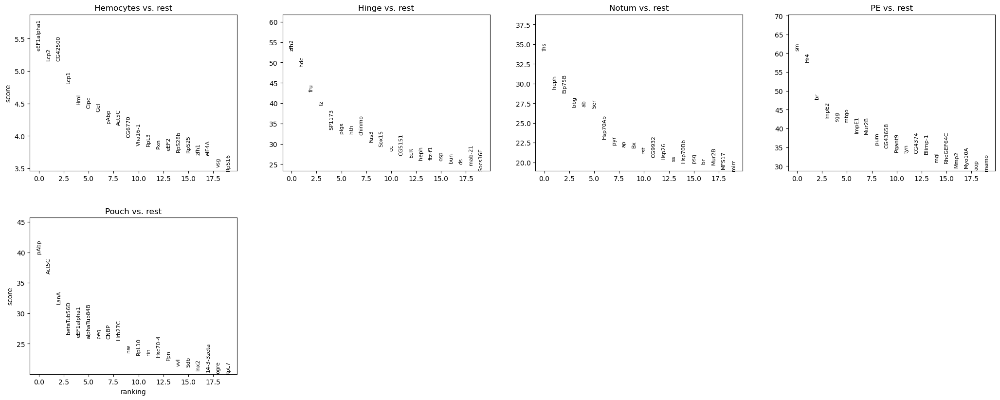

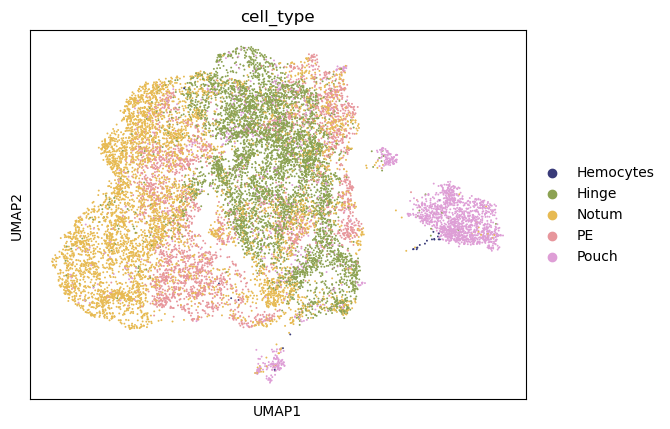

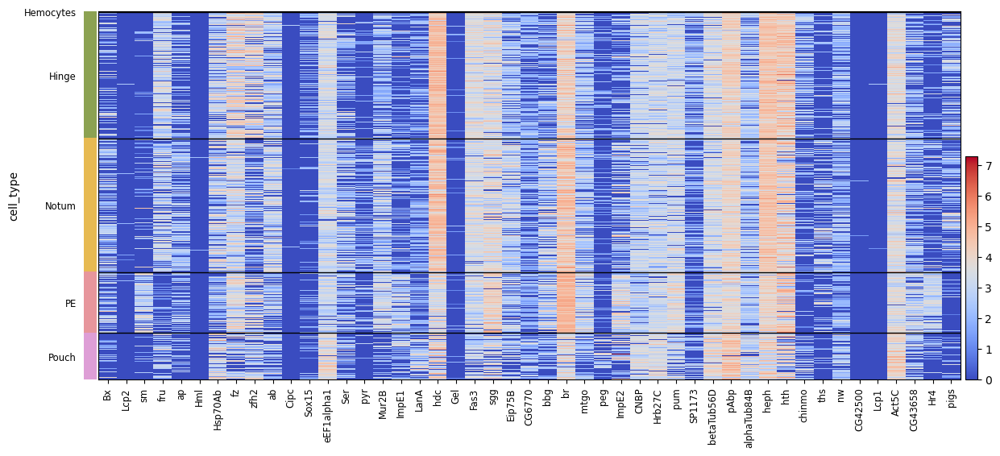

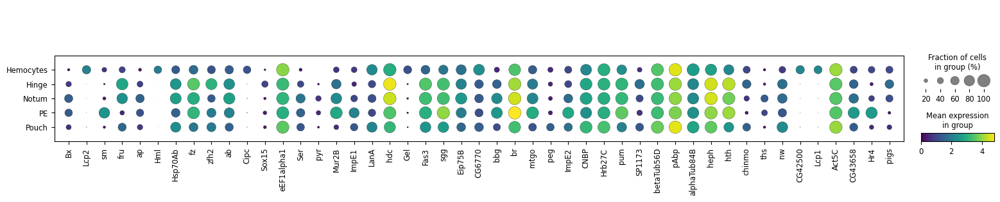

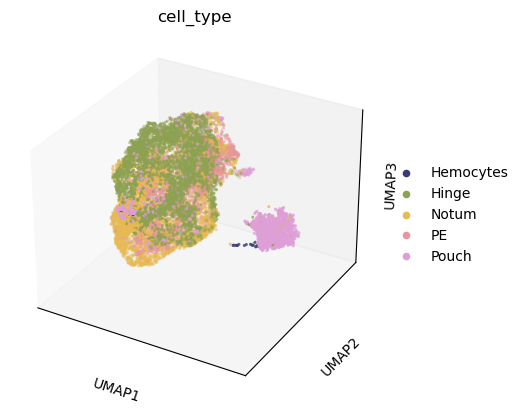

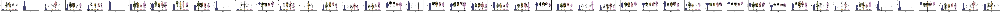

Running analysis for ctrl


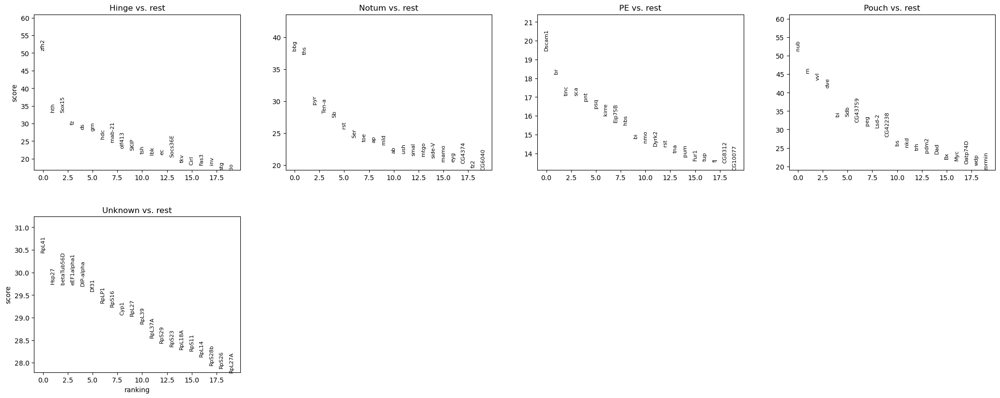

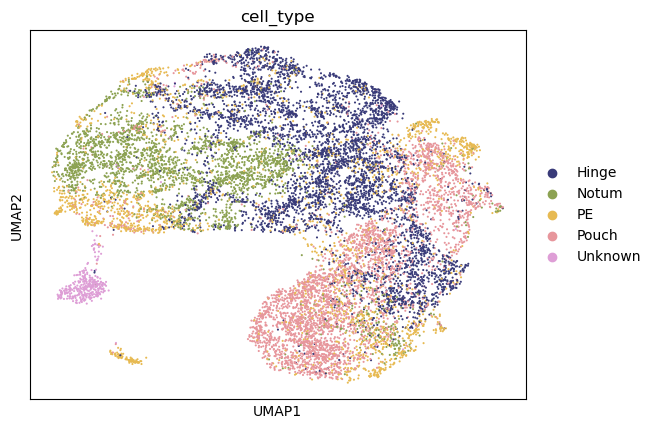

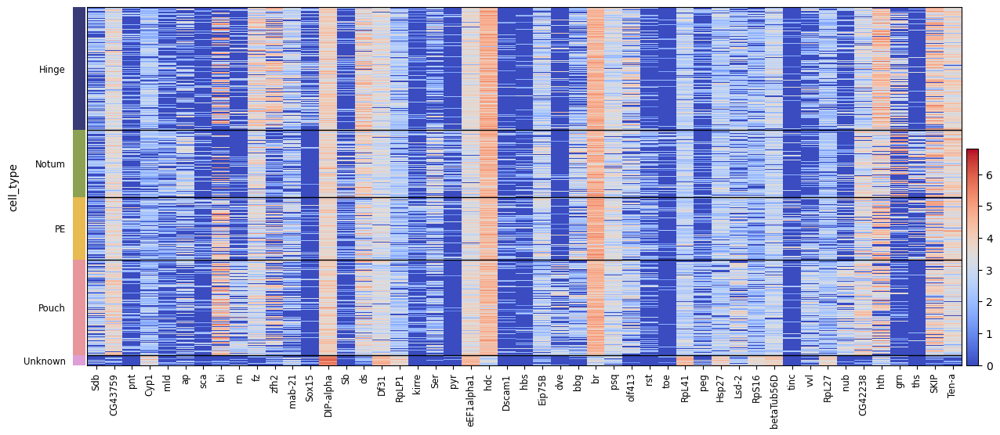

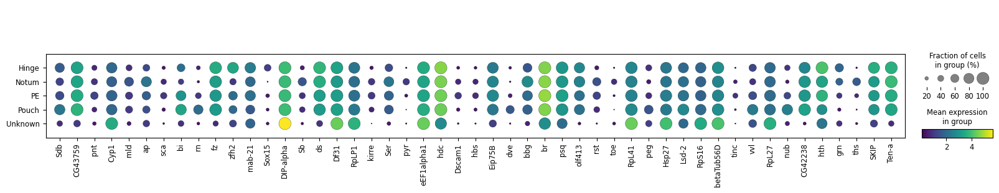

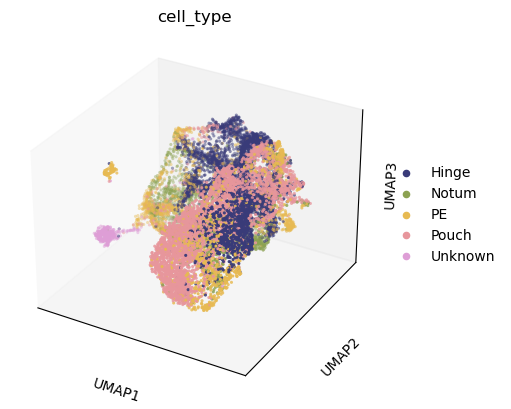

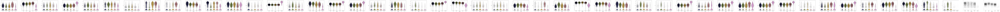

/Users/sbidanta/opt/anaconda3/envs/drosophila/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [5]:
import os
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import gseapy as gp
from scipy.stats import pearsonr

# Load scRNA-seq data
def load_scRNA_seq_data(sample_name, data_directory):
    try:
        matrix_file = os.path.join(data_directory, sample_name, 'matrix.mtx.gz')
        genes_file = os.path.join(data_directory, sample_name, 'genes.tsv.gz')
        barcodes_file = os.path.join(data_directory, sample_name, 'barcodes.tsv.gz')

        if not all(os.path.exists(f) for f in [matrix_file, genes_file, barcodes_file]):
            raise FileNotFoundError(f"One or more input files for {sample_name} are missing.")
        
        adata = sc.read_mtx(matrix_file).T
        adata.var_names = pd.read_csv(genes_file, header=None, sep='\t')[0].values
        adata.obs_names = pd.read_csv(barcodes_file, header=None)[0].values
        return adata
    except Exception as e:
        print(f"Error loading data for {sample_name}: {e}")
        return None

# Preprocess data for visualization and clustering
def preprocess_data_for_visualization(adata):
    try:
        sc.pp.normalize_total(adata, target_sum=1e4)
        sc.pp.log1p(adata)
        sc.pp.highly_variable_genes(adata, n_top_genes=1000)
        sc.tl.pca(adata, svd_solver='arpack')
        sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
        sc.tl.umap(adata)
        sc.tl.leiden(adata, resolution=2.0)
        return adata
    except Exception as e:
        print(f"Error during preprocessing: {e}")
        return None

# Assign cell types from annotation files with prefix cleaning
def assign_cell_types_from_annotations(adata, annotation_file, barcode_column, annotation_column, prefix_to_strip):
    try:
        annotations = pd.read_csv(annotation_file)
        annotations[barcode_column] = annotations[barcode_column].astype(str)
        
        # Clean barcodes by removing the prefix
        adata.obs_names = adata.obs_names.str.replace(prefix_to_strip, "")
        annotations = annotations.set_index(barcode_column)
        
        # Map annotations to the corresponding cell types
        adata.obs['cell_type'] = adata.obs_names.map(annotations[annotation_column]).fillna('Unknown')
        return adata
    except Exception as e:
        print(f"Error assigning cell types: {e}")
        return None

# Perform DGE analysis
def perform_dge_analysis(adata, groupby='cell_type'):
    try:
        sc.tl.rank_genes_groups(adata, groupby=groupby, method='wilcoxon', use_raw=False)
        sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)
        return adata
    except Exception as e:
        print(f"Error during DGE analysis: {e}")
        return None

# Get the top differentially expressed genes
def get_top_genes_for_plotting(adata, n_genes=10):
    try:
        clusters = adata.uns['rank_genes_groups']['names'].dtype.names
        top_genes = set()
        
        for cluster in clusters:
            top_genes.update(adata.uns['rank_genes_groups']['names'][cluster][:n_genes])
        
        return list(top_genes)
    except Exception as e:
        print(f"Error extracting top genes: {e}")
        return []

# Perform pathway and functional enrichment analysis
def perform_pathway_enrichment(degs, sample_id, output_dir, method='GSEA', analysis_type='GO_Biological_Process'):
    try:
        os.makedirs(output_dir, exist_ok=True)

        if len(degs) == 0:
            print(f"No DEGs found for sample {sample_id}")
            return

        if method == 'GSEA':
            enrichr_results = gp.enrichr(gene_list=degs, gene_sets=[analysis_type], organism='fly', outdir=output_dir)
        elif method == 'GO':
            enrichr_results = gp.enrichr(gene_list=degs, gene_sets=[analysis_type], organism='fly', outdir=output_dir)
        elif method == 'KEGG':
            enrichr_results = gp.enrichr(gene_list=degs, gene_sets=['KEGG_2019_Drosophila'], organism='fly', outdir=output_dir)
        else:
            print(f"Unsupported method: {method}. Supported methods are 'GSEA', 'GO', and 'KEGG'.")
            return
        
        enrichr_results.plot_results()
        print(f"{method} Enrichment analysis completed for {sample_id}.")
    
    except Exception as e:
        print(f"Error during {method} enrichment analysis for {sample_id}: {e}")

# Plot UMAP with cell type labels using distinct color palette
def plot_umap_with_cell_types(adata, sample_id, output_dir):
    try:
        os.makedirs(output_dir, exist_ok=True)
        sc.pl.umap(adata, color='cell_type', palette='tab20b', save=f'_{sample_id}_umap_cell_types.png')
    except Exception as e:
        print(f"Error plotting UMAP for {sample_id}: {e}")

# Plot Expression Dotplot using viridis palette
def plot_expression_dotplot(adata, sample_id, output_dir, genes, groupby='cell_type'):
    try:
        os.makedirs(output_dir, exist_ok=True)
        valid_genes = [gene for gene in genes if gene in adata.var_names]

        if not valid_genes:
            print(f"No valid genes found in {sample_id} for dotplot.")
            return
        
        sc.pl.dotplot(adata, var_names=valid_genes, groupby=groupby, use_raw=False, color_map="viridis", save=f'_{sample_id}_dotplot.png')
    except Exception as e:
        print(f"Error plotting dotplot for {sample_id}: {e}")

# Plot Violin plot of gene expression
def plot_violin(adata, sample_id, output_dir, marker_genes):
    try:
        os.makedirs(output_dir, exist_ok=True)
        valid_genes = [gene for gene in marker_genes if gene in adata.var_names]

        if not valid_genes:
            print(f"No valid marker genes found in {sample_id} for violin plot.")
            return
        
        sc.pl.violin(adata, keys=valid_genes, groupby='cell_type', jitter=0.4, multi_panel=True)
        plt.savefig(os.path.join(output_dir, f'{sample_id}_violin_plot.png'))
        plt.close()
    except Exception as e:
        print(f"Error plotting violin plot for {sample_id}: {e}")

# Plot heatmap of gene expression using coolwarm palette
def plot_heatmap(adata, sample_id, output_dir, marker_genes, groupby='cell_type'):
    try:
        os.makedirs(output_dir, exist_ok=True)
        sc.pl.heatmap(adata, var_names=marker_genes, groupby=groupby, cmap='coolwarm', save=f'_{sample_id}_heatmap.png')
    except Exception as e:
        print(f"Error plotting heatmap for {sample_id}: {e}")

# Plot correlation matrix
def plot_correlation(adata, sample_id, output_dir, marker_genes):
    try:
        os.makedirs(output_dir, exist_ok=True)
        valid_genes = [gene for gene in marker_genes if gene in adata.var_names]
        
        if not valid_genes:
            print(f"No valid genes found in {sample_id} for correlation plot.")
            return
        
        gene_expr = adata[:, valid_genes].X.toarray()
        gene_df = pd.DataFrame(gene_expr, columns=valid_genes)
        corr_matrix = gene_df.corr()
        
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
        plt.title(f'Correlation Matrix for {sample_id}')
        plt.savefig(os.path.join(output_dir, f'{sample_id}_correlation_matrix.png'))
        plt.close()
    except Exception as e:
        print(f"Error plotting correlation matrix for {sample_id}: {e}")

# Plot volcano plot
def plot_volcano(adata, sample_id, output_dir):
    try:
        os.makedirs(output_dir, exist_ok=True)
        cluster_name = list(adata.uns['rank_genes_groups']['names'].dtype.names)[0]
        degs = pd.DataFrame({
            'gene': adata.uns['rank_genes_groups']['names'][cluster_name],
            'logfoldchanges': adata.uns['rank_genes_groups']['logfoldchanges'][cluster_name],
            'pvals_adj': adata.uns['rank_genes_groups']['pvals_adj'][cluster_name]
        })

        plt.figure(figsize=(8, 6))
        plt.scatter(degs['logfoldchanges'], -np.log10(degs['pvals_adj']), c='b')
        significant = (degs['pvals_adj'] < 0.05) & (abs(degs['logfoldchanges']) > 1)
        plt.scatter(degs.loc[significant, 'logfoldchanges'], -np.log10(degs.loc[significant, 'pvals_adj']), c='r')
        plt.title(f'Volcano Plot for {sample_id}')
        plt.xlabel('Log2 Fold Change')
        plt.ylabel('-log10(Adjusted P-Value)')
        plt.savefig(os.path.join(output_dir, f'{sample_id}_volcano_plot.png'))
        plt.close()
    except Exception as e:
        print(f"Error plotting volcano plot for {sample_id}: {e}")

# Plot 3D UMAP with distinct palette
def plot_3d_umap(adata, sample_id, output_dir):
    try:
        os.makedirs(output_dir, exist_ok=True)
        sc.tl.umap(adata, n_components=3)
        sc.pl.umap(adata, color='cell_type', projection='3d', palette="tab20b", save=f'_{sample_id}_umap_3d.png')
    except Exception as e:
        print(f"Error plotting 3D UMAP for {sample_id}: {e}")

# Main analysis pipeline
def analyze_and_visualize(data_directory, samples, annotation_files, barcode_column, annotation_column, output_dir_default, n_top_genes=10):
    os.makedirs(output_dir_default, exist_ok=True)
    
    for sample_id, sample_name in samples.items():
        print(f'Running analysis for {sample_id}')
        adata = load_scRNA_seq_data(sample_name, data_directory)
        if adata is None:
            continue

        adata = preprocess_data_for_visualization(adata)
        if adata is None:
            continue
        
        prefix_to_strip = 'iEC_' if sample_id == 'iEC' else 'Ctrl_'
        annotation_file = os.path.join(data_directory, annotation_files[sample_id])
        adata = assign_cell_types_from_annotations(adata, annotation_file, barcode_column, annotation_column, prefix_to_strip)
        if adata is None:
            continue
        
        adata = perform_dge_analysis(adata)
        if adata is None:
            continue

        top_genes = get_top_genes_for_plotting(adata, n_genes=n_top_genes)

        plot_umap_with_cell_types(adata, sample_id, output_dir_default)
        plot_heatmap(adata, sample_id, output_dir_default, marker_genes=top_genes)
        plot_expression_dotplot(adata, sample_id, output_dir_default, genes=top_genes)
        plot_3d_umap(adata, sample_id, output_dir_default)
        plot_violin(adata, sample_id, output_dir_default, marker_genes=top_genes)
        plot_correlation(adata, sample_id, output_dir_default, marker_genes=top_genes)
        plot_volcano(adata, sample_id, output_dir_default)

# Example usage
data_directory = '../data/Hunter_fruitfly/'
samples = {'iEC': 'iec_output', 'ctrl': 'ctrl_output'}
annotation_files = {
    'iEC': 'iEC_barcodes_tissueAnnotations.csv',
    'ctrl': 'Ctrl_barcodes_tissueAnnotations.csv'
}
barcode_column = 'Unnamed: 0'
annotation_column = 'celltype'

output_dir_default = '../output/CMG'

# Run the analysis with top 10 genes
analyze_and_visualize(data_directory, samples, annotation_files, barcode_column, annotation_column, output_dir_default, n_top_genes=10)
